In [1]:
!pip install patchify

In [2]:
import os
import pandas as pd
import cv2
import numpy as np
from PIL import Image
from patchify import patchify
from sklearn.preprocessing import MinMaxScaler,StandardScaler
from matplotlib import pyplot as plt
import random

In [3]:
minmaxscaler = MinMaxScaler()        #like normalization

In [4]:
dataset_root_folder = '/Users/dhirajmarathe/Downloads/Semantic segmentation dataset'

In [5]:
for i,j,k in os.walk(dataset_root_folder):
    dir = i.split(os.path.sep)[-1]
    print(dir)

Semantic segmentation dataset
Tile 8
images
masks
Tile 1
images
masks
Tile 6
images
masks
Tile 7
images
masks
Tile 5
images
masks
Tile 2
images
masks
Tile 3
images
masks
Tile 4
images
masks


In [6]:
image = cv2.imread('/Users/dhirajmarathe/Downloads/Semantic segmentation dataset/Tile 1/images/image_part_001.jpg',1)

In [7]:
image

array([[[201, 195, 190],
        [225, 219, 214],
        [241, 232, 228],
        ...,
        [255, 236, 231],
        [254, 234, 229],
        [255, 239, 234]],

       [[226, 220, 215],
        [254, 248, 243],
        [255, 255, 251],
        ...,
        [252, 231, 229],
        [247, 228, 223],
        [242, 223, 218]],

       [[248, 241, 238],
        [255, 252, 249],
        [255, 255, 251],
        ...,
        [253, 234, 231],
        [252, 235, 232],
        [245, 228, 225]],

       ...,

       [[211, 200, 203],
        [220, 209, 212],
        [221, 211, 217],
        ...,
        [220, 229, 242],
        [234, 243, 255],
        [235, 244, 255]],

       [[209, 198, 201],
        [219, 208, 211],
        [220, 210, 216],
        ...,
        [213, 222, 235],
        [222, 231, 244],
        [218, 227, 240]],

       [[213, 202, 205],
        [210, 199, 202],
        [201, 191, 197],
        ...,
        [223, 232, 245],
        [233, 242, 255],
        [230, 239, 252]]

In [8]:
type(Image.fromarray(image))

PIL.Image.Image

In [9]:
image.shape

(644, 797, 3)

In [10]:
image_patch_size = 256

In [11]:
image_patches = patchify(image,(image_patch_size,image_patch_size,3),step=image_patch_size)

In [12]:
image_x = image_patches[0,0,:,:]
minmaxscaler = MinMaxScaler()
image_y=minmaxscaler.fit_transform(image_x.reshape(-1,image_x.shape[-1])).reshape(image_x.shape)

In [13]:
image_y.shape

(1, 256, 256, 3)

In [14]:
image_dataset = []
mask_dataset = []
# image_extenstion = 'jpg'
for image_type in ['images','masks']:
    if image_type == 'images':
        image_extenstion = 'jpg'
    elif image_type=='masks':
        image_extenstion = 'png'
    
    for tile_id in range(1,8):
        for image_id in range(1,10):
            image = cv2.imread(f'/Users/dhirajmarathe/Downloads/Semantic segmentation dataset/Tile {tile_id}/{image_type}/image_part_00{image_id}.{image_extenstion}',1)
            if image is not None:
                if image_type == 'masks':
                    image = cv2.cvtColor(image,cv2.COLOR_BGR2RGB)
                size_x = (image.shape[1]//image_patch_size )*image_patch_size
                size_y = (image.shape[0]//image_patch_size )*image_patch_size
                # print(size_x,size_y)                           ### adjested the sizes into multiple of 256 
                image = Image.fromarray(image)
                image = image.crop((0,0,size_x,size_y))
                # print(image.size[0],image.size[1])
                image = np.array(image)
                patched_images = patchify(image,(image_patch_size,image_patch_size,3),step=image_patch_size)
                # print(len(patched_images))
                for i in range(patched_images.shape[0]):
                    for j in range(patched_images.shape[1]):
                        
                        if image_type == 'images':
                            individual_patched_image = patched_images[i,j,:,:]
                            # print(individual_patched_image.shape)
                            individual_patched_image = minmaxscaler.fit_transform(individual_patched_image.reshape(-1,individual_patched_image.shape[-1])).reshape(individual_patched_image.shape)
                            individual_patched_image = individual_patched_image[0]
                            # print(individual_patched_image.shape)
                            image_dataset.append(individual_patched_image)
                        elif image_type=='masks':
                            individual_patched_mask = patched_images[i,j,:,:]
                            individual_patched_mask = individual_patched_mask[0]
                            mask_dataset.append(individual_patched_mask)
                        # image_dataset.append(individual_patched_image)

In [15]:
print(len(image_dataset))
print(len(mask_dataset))

945
945


In [16]:
image_dataset = np.array(image_dataset)
mask_dataset = np.array(mask_dataset)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


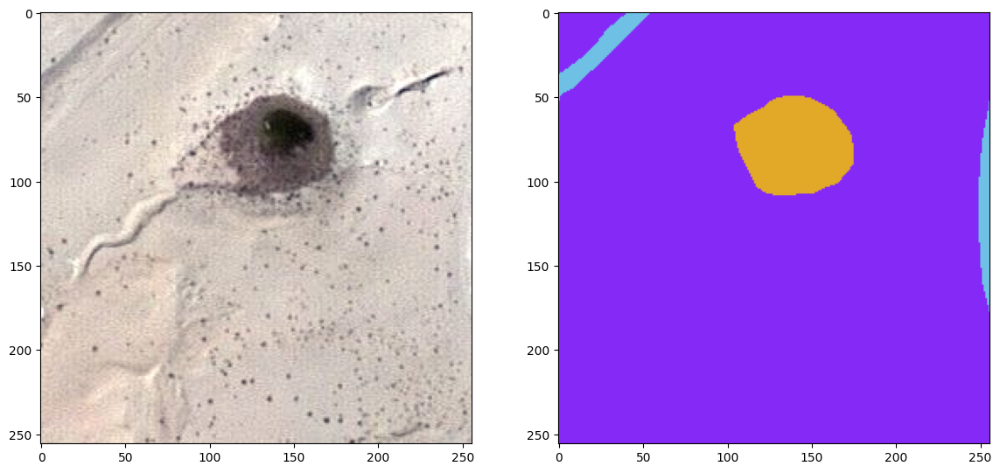

In [17]:
random_image_id = random.randint(0,len(image_dataset))
plt.figure(figsize=(14,8))
plt.subplot(121)
plt.imshow(image_dataset[random_image_id])
plt.subplot(122)
plt.imshow(mask_dataset[random_image_id])


In [18]:
class_building = '#3C1098'   ## given 
class_building = class_building.lstrip('#')
class_building = np.array(tuple(int(class_building[i:i+2], 16) for i in (0,2,4)))     ## to split 3C1098 into 3C 10 98
print(class_building)

class_land = '#8429F6'   ## given 
class_land = class_land.lstrip('#')
class_land = np.array(tuple(int(class_land[i:i+2], 16) for i in (0,2,4)))
print(class_land) 

class_road = '#6EC1E4'   ## given 
class_road = class_road.lstrip('#')
class_road = np.array(tuple(int(class_road[i:i+2], 16) for i in (0,2,4)))
print(class_road)

class_vegetation = '#FEDD3A'   ## given 
class_vegetation = class_vegetation.lstrip('#')
class_vegetation = np.array(tuple(int(class_vegetation[i:i+2], 16) for i in (0,2,4)))
print(class_vegetation)

class_water = '#E2A929'   ## given 
class_water = class_water.lstrip('#')
class_water = np.array(tuple(int(class_water[i:i+2], 16) for i in (0,2,4)))
print(class_water)

class_unlabeled = '#9B9B9B'   ## given 
class_unlabeled = class_unlabeled.lstrip('#')
class_unlabeled = np.array(tuple(int(class_unlabeled[i:i+2], 16) for i in (0,2,4)))
print(class_unlabeled)




[ 60  16 152]
[132  41 246]
[110 193 228]
[254 221  58]
[226 169  41]
[155 155 155]


In [19]:
def rgb_to_label(label):
    label_segment = np.zeros(label.shape, dtype=np.uint8)
    label_segment[np.all(label == class_water, axis=-1)] = 0
    label_segment[np.all(label == class_land, axis=-1)] = 1
    label_segment[np.all(label == class_road, axis=-1)] = 2
    label_segment[np.all(label == class_building, axis=-1)] = 3
    label_segment[np.all(label == class_vegetation, axis=-1)] = 4
    label_segment[np.all(label == class_unlabeled, axis=-1)] = 5
    label_segment = label_segment[:,:,0]
    return label_segment
    

In [20]:
labels = []
for i in range(mask_dataset.shape[0]):
  label = rgb_to_label(mask_dataset[i])
  labels.append(label)

In [21]:
print(len(labels))

945


In [22]:
labels = np.expand_dims(labels,axis=3)

In [23]:
labels

array([[[[1],
         [1],
         [1],
         ...,
         [1],
         [1],
         [1]],

        [[1],
         [1],
         [1],
         ...,
         [1],
         [1],
         [1]],

        [[1],
         [1],
         [1],
         ...,
         [1],
         [1],
         [1]],

        ...,

        [[1],
         [1],
         [1],
         ...,
         [1],
         [1],
         [1]],

        [[1],
         [1],
         [1],
         ...,
         [1],
         [1],
         [1]],

        [[1],
         [1],
         [1],
         ...,
         [1],
         [1],
         [1]]],


       [[[1],
         [5],
         [5],
         ...,
         [0],
         [0],
         [0]],

        [[1],
         [5],
         [5],
         ...,
         [0],
         [0],
         [0]],

        [[1],
         [1],
         [5],
         ...,
         [0],
         [0],
         [0]],

        ...,

        [[1],
         [1],
         [1],
         ...,
         [2],


In [24]:
np.unique(labels)

array([0, 1, 2, 3, 4, 5], dtype=uint8)

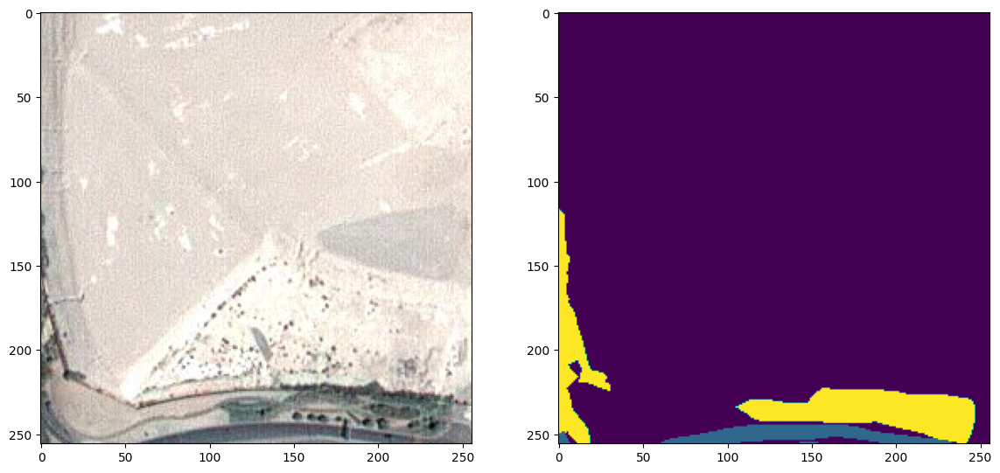

In [25]:
random_image_id = random.randint(0,len(image_dataset))
plt.figure(figsize=(14,8))
plt.subplot(121)
plt.imshow(image_dataset[random_image_id])
plt.subplot(122)
plt.imshow(labels[random_image_id])


In [26]:
master_training_dataset = image_dataset

In [27]:
total_classes = len(np.unique(labels))

In [28]:
from tensorflow.keras.utils import to_categorical 


In [29]:
labels_categorical_dataset = to_categorical(labels, num_classes=total_classes)


In [30]:
labels_categorical_dataset

array([[[[0., 1., 0., 0., 0., 0.],
         [0., 1., 0., 0., 0., 0.],
         [0., 1., 0., 0., 0., 0.],
         ...,
         [0., 1., 0., 0., 0., 0.],
         [0., 1., 0., 0., 0., 0.],
         [0., 1., 0., 0., 0., 0.]],

        [[0., 1., 0., 0., 0., 0.],
         [0., 1., 0., 0., 0., 0.],
         [0., 1., 0., 0., 0., 0.],
         ...,
         [0., 1., 0., 0., 0., 0.],
         [0., 1., 0., 0., 0., 0.],
         [0., 1., 0., 0., 0., 0.]],

        [[0., 1., 0., 0., 0., 0.],
         [0., 1., 0., 0., 0., 0.],
         [0., 1., 0., 0., 0., 0.],
         ...,
         [0., 1., 0., 0., 0., 0.],
         [0., 1., 0., 0., 0., 0.],
         [0., 1., 0., 0., 0., 0.]],

        ...,

        [[0., 1., 0., 0., 0., 0.],
         [0., 1., 0., 0., 0., 0.],
         [0., 1., 0., 0., 0., 0.],
         ...,
         [0., 1., 0., 0., 0., 0.],
         [0., 1., 0., 0., 0., 0.],
         [0., 1., 0., 0., 0., 0.]],

        [[0., 1., 0., 0., 0., 0.],
         [0., 1., 0., 0., 0., 0.],
         [0.

In [31]:
from sklearn.model_selection import train_test_split

In [32]:
X_train,X_test,y_train,y_test=train_test_split(master_training_dataset,labels_categorical_dataset,test_size=0.15,random_state=100)

In [33]:
print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)

(803, 256, 256, 3)
(142, 256, 256, 3)
(803, 256, 256, 6)
(142, 256, 256, 6)


In [34]:
image_height = X_train.shape[1]
image_width = X_train.shape[2]
image_channels = X_train.shape[3]
total_classes = y_train.shape[3]

In [35]:
print(image_height)
print(image_width)
print(image_channels)
print(total_classes)

256
256
3
6


In [36]:
from keras.models import Model
from keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, Conv2DTranspose
from keras.layers import concatenate, BatchNormalization, Dropout, Lambda

In [37]:
from keras import backend as K       ## backend means tensor flow , means tesor level calculation

In [38]:
## jecard index - it is tech to identify the similarity between the two set , it is calculate by dividing the intersection by union this gives the similiarity 


def jaccard_coef(y_true, y_pred):
  y_true_flatten = K.flatten(y_true)
  y_pred_flatten = K.flatten(y_pred)
  intersection = K.sum(y_true_flatten * y_pred_flatten)
  final_coef_value = (intersection + 1.0) / (K.sum(y_true_flatten) + K.sum(y_pred_flatten) - intersection + 1.0)
  return final_coef_value
    

In [106]:
## this is based on unet model architechture

def multi_unet_model(n_classes = 5, image_height = 256, image_width = 256, image_channels = 1):
    
    inputs = Input((image_height, image_width, image_channels))

    source_input = inputs
    
    c1 = Conv2D(16,(3,3), activation = "relu", kernel_initializer="he_normal", padding = "same")(source_input)
    c1 = Dropout(0.2)(c1)
    c1 = Conv2D(16,(3,3), activation = "relu", kernel_initializer="he_normal", padding = "same")(c1)
    p1 = MaxPooling2D((2,2))(c1)

    c2 = Conv2D(32,(3,3), activation = "relu", kernel_initializer="he_normal", padding = "same")(p1)
    c2 = Dropout(0.2)(c2)
    c2 = Conv2D(32,(3,3), activation = "relu", kernel_initializer="he_normal", padding = "same")(c2)
    p2 = MaxPooling2D((2,2))(c2)

    c3 = Conv2D(64,(3,3), activation = "relu", kernel_initializer="he_normal", padding = "same")(p2)
    c3 = Dropout(0.2)(c3)
    c3 = Conv2D(64,(3,3), activation = "relu", kernel_initializer="he_normal", padding = "same")(c3)
    p3 = MaxPooling2D((2,2))(c3)

    c4 = Conv2D(128,(3,3), activation = "relu", kernel_initializer="he_normal", padding = "same")(p3)
    c4 = Dropout(0.2)(c4)
    c4 = Conv2D(128,(3,3), activation = "relu", kernel_initializer="he_normal", padding = "same")(c4)
    p4 = MaxPooling2D((2,2))(c4)

    c5 = Conv2D(256,(3,3), activation = "relu", kernel_initializer="he_normal", padding = "same")(p4)
    c5 = Dropout(0.2)(c5)
    c5 = Conv2D(256,(3,3), activation = "relu", kernel_initializer="he_normal", padding = "same")(c5)
    # p5 = MaxPooling2D((2,2))(c5) ## here as we are going uppwards in architecture so we will not use this

    u6 = Conv2DTranspose(128, (2,2), strides=(2,2), padding="same")(c5)
    u6 = concatenate([u6,c4])
    c6 = Conv2D(128,(3,3), activation = "relu", kernel_initializer="he_normal", padding = "same")(u6)
    c6 = Dropout(0.2)(u6)
    c6 = Conv2D(128, (3,3), activation="relu", kernel_initializer="he_normal", padding="same")(c6)

    u7 = Conv2DTranspose(64, (2,2), strides=(2,2), padding="same")(c6)
    u7 = concatenate([u7, c3])
    c7 = Conv2D(64, (3,3), activation="relu", kernel_initializer="he_normal", padding="same")(u7)
    c7 = Dropout(0.2)(c7)
    c7 = Conv2D(64, (3,3), activation="relu", kernel_initializer="he_normal", padding="same")(c7)

    u8 = Conv2DTranspose(32, (2,2), strides=(2,2), padding="same")(c7)
    u8 = concatenate([u8, c2])
    c8 = Conv2D(32, (3,3), activation="relu", kernel_initializer="he_normal", padding="same")(u8)
    c8 = Dropout(0.2)(c8)
    c8 = Conv2D(32, (3,3), activation="relu", kernel_initializer="he_normal", padding="same")(c8)

    u9 = Conv2DTranspose(16, (2,2), strides=(2,2), padding="same")(c8)
    u9 = concatenate([u9, c1], axis=3)
    c9 = Conv2D(16, (3,3), activation="relu", kernel_initializer="he_normal", padding="same")(u9)
    c9 = Dropout(0.2)(c9)
    c9 = Conv2D(16, (3,3), activation="relu", kernel_initializer="he_normal", padding="same")(c9)

    outputs = Conv2D(n_classes, (1,1), activation="softmax")(c9)

    model = Model(inputs=[inputs], outputs=[outputs])
    return model
    

    

In [107]:
metrics = ["accuracy", jaccard_coef]


In [108]:
def get_deep_learning_model():
    return multi_unet_model(n_classes = total_classes, image_height = image_height, image_width = image_width, image_channels = image_channels)
    

In [109]:
model = get_deep_learning_model()

In [110]:
model.get_config()

{'name': 'model',
 'trainable': True,
 'layers': [{'module': 'keras.layers',
   'class_name': 'InputLayer',
   'config': {'batch_input_shape': (None, 256, 256, 3),
    'dtype': 'float32',
    'sparse': False,
    'ragged': False,
    'name': 'input_1'},
   'registered_name': None,
   'name': 'input_1',
   'inbound_nodes': []},
  {'module': 'keras.layers',
   'class_name': 'Conv2D',
   'config': {'name': 'conv2d',
    'trainable': True,
    'dtype': 'float32',
    'filters': 16,
    'kernel_size': (3, 3),
    'strides': (1, 1),
    'padding': 'same',
    'data_format': 'channels_last',
    'dilation_rate': (1, 1),
    'groups': 1,
    'activation': 'relu',
    'use_bias': True,
    'kernel_initializer': {'module': 'keras.initializers',
     'class_name': 'HeNormal',
     'config': {'seed': None},
     'registered_name': None},
    'bias_initializer': {'module': 'keras.initializers',
     'class_name': 'Zeros',
     'config': {},
     'registered_name': None},
    'kernel_regularizer': N

In [111]:
weights = [0.166,0.166,0.166,0.166,0.166,0.166]


In [112]:
!pip install -U segmentation_models==0.2.1

In [59]:
# import segmentation_models as sm


In [60]:
# dice_loss = sm.losses.DiceLoss(class_weights = weights)


In [49]:
# import tensorflow as tf

# # Define class weights
# class_weights = [0.1666, 0.1666, 0.1666, 0.1666, 0.1666, 0.1666]

# # Dice Loss function
# def dice_loss(y_true, y_pred):
#     smooth = 1e-6
#     intersection = tf.reduce_sum(y_true * y_pred, axis=(1,2,3))
#     union = tf.reduce_sum(y_true, axis=(1,2,3)) + tf.reduce_sum(y_pred, axis=(1,2,3))
#     dice = tf.reduce_mean((2.0 * intersection + smooth) / (union + smooth))
#     return 1.0 - dice

# # Focal Loss function
# def focal_loss(y_true, y_pred):
#     gamma = 2.0
#     alpha = class_weights
#     pt = tf.where(tf.equal(y_true, 1), y_pred, 1 - y_pred)
#     focal_loss = -tf.reduce_mean(alpha * (1 - pt) ** gamma * tf.math.log(pt))
#     return focal_loss

# # Total Loss function
# def total_loss(y_true, y_pred):
#     return dice_loss(y_true, y_pred) + (1 * focal_loss(y_true, y_pred))


In [113]:
tf.keras.backend.clear_session()

In [114]:
model.compile(optimizer = "adam", loss = 'categorical_crossentropy', metrics=metrics)

In [115]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 256, 256, 3)]        0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, 256, 256, 16)         448       ['input_1[0][0]']             
                                                                                                  
 dropout (Dropout)           (None, 256, 256, 16)         0         ['conv2d[0][0]']              
                                                                                                  
 conv2d_1 (Conv2D)           (None, 256, 256, 16)         2320      ['dropout[0][0]']             
                                                                                              

In [118]:
pip install tensorflow-macos


Note: you may need to restart the kernel to use updated packages.


In [119]:
import os
os.environ["TF_METAL_DEVICE_NAME"] = "eGPU"


In [121]:
import os

metal_device_name = os.environ.get("TF_METAL_DEVICE_NAME")
if metal_device_name == "eGPU":
    print("Metal backend is enabled with eGPU.")
else:
    print("Metal backend is not enabled or configured with a different device.")


Metal backend is enabled with eGPU.


In [ ]:
import wandb
wandb.login(key="YOUR_API_KEY")


In [145]:
import wandb
from wandb.keras import WandbCallback
     

In [152]:
wandb.login(key="6360597f131a73d92050df704e92b0d5b6cdf6cc")
# "6360597f131a73d92050df704e92b0d5b6cdf6cc"

wandb: Currently logged in as: dm3360353 (deployment). Use `wandb login --relogin` to force relogin
wandb: WARNING If you're specifying your api key in code, ensure this code is not shared publicly.
wandb: WARNING Consider setting the WANDB_API_KEY environment variable, or running `wandb login` from the command line.
wandb: Appending key for api.wandb.ai to your netrc file: /Users/dhirajmarathe/.netrc


True

In [161]:
# wandb.init(project="satellite-segmentation-dubai-images", entity="deployment")
wandb.init(settings=wandb.Settings(start_method="thread"))

Problem at: /var/folders/nv/9jn8dp9j3qn4qb674y2qj5k00000gn/T/ipykernel_34317/4276083326.py 2 <module>


CommError: Run initialization has timed out after 90.0 sec. 
Please refer to the documentation for additional information: https://docs.wandb.ai/guides/track/tracking-faq#initstarterror-error-communicating-with-wandb-process-

In [158]:
!wandb status
     

Current Settings
{
  "_extra_http_headers": null,
  "_proxies": null,
  "api_key": null,
  "base_url": "https://api.wandb.ai",
  "entity": null,
  "git_remote": "origin",
  "ignore_globs": [],
  "project": null,
  "root_dir": null,
  "section": "default"
}


In [159]:
wandb.log({'accuracy': jaccard_coef, 'loss': 'categorical_crossentropy'})


Error: You must call wandb.init() before wandb.log()

In [144]:
model_history = model.fit(X_train, y_train,
                          batch_size=16,
                          verbose=1,
                          epochs=100,
                          validation_data=(X_test, y_test),
                          shuffle=False)

In [123]:
history_a = model_history

In [124]:
history_a

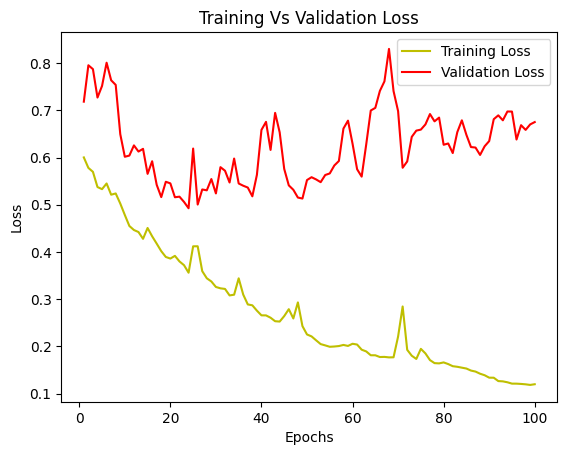

In [207]:
loss = history_a.history['loss']
val_loss = history_a.history['val_loss']
epochs = range(1, len(loss) + 1)
plt.plot(epochs, loss, 'y', label="Training Loss")
plt.plot(epochs, val_loss, 'r', label="Validation Loss")
plt.title("Training Vs Validation Loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend()
plt.show()

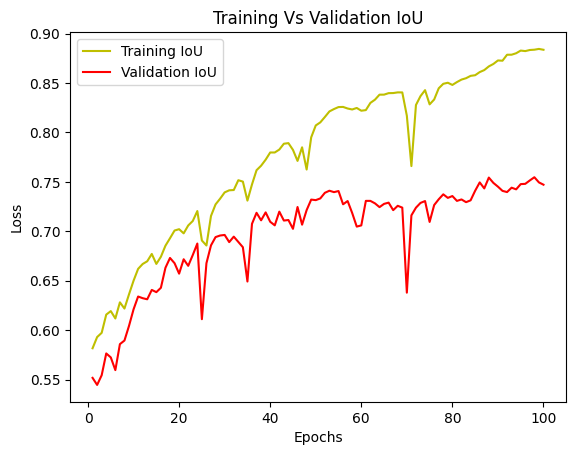

In [126]:

jaccard_coef = history_a.history['jaccard_coef']
val_jaccard_coef = history_a.history['val_jaccard_coef']

epochs = range(1, len(jaccard_coef) + 1)
plt.plot(epochs, jaccard_coef, 'y', label="Training IoU")
plt.plot(epochs, val_jaccard_coef, 'r', label="Validation IoU")
plt.title("Training Vs Validation IoU")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend()
plt.show()

In [127]:
model_history.params

{'verbose': 1, 'epochs': 100, 'steps': 51}

In [208]:
model_history.params

{'verbose': 1, 'epochs': 100, 'steps': 51}

In [128]:
y_pred = model.predict(X_test)


5/5 [==============================] - 6s 1s/step


In [129]:
pip install tensorflow-metal


Note: you may need to restart the kernel to use updated packages.


In [130]:
y_pred_argmax = np.argmax(y_pred, axis=3)

In [131]:
y_pred_argmax

array([[[1, 3, 3, ..., 4, 1, 1],
        [3, 3, 3, ..., 1, 1, 1],
        [3, 3, 3, ..., 1, 1, 1],
        ...,
        [0, 0, 0, ..., 1, 1, 1],
        [0, 0, 0, ..., 1, 1, 1],
        [0, 0, 0, ..., 1, 1, 1]],

       [[0, 0, 0, ..., 4, 4, 4],
        [0, 0, 0, ..., 4, 4, 4],
        [0, 0, 0, ..., 4, 4, 4],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]],

       [[2, 2, 2, ..., 1, 1, 1],
        [2, 2, 2, ..., 1, 1, 1],
        [2, 2, 2, ..., 1, 1, 1],
        ...,
        [2, 2, 2, ..., 4, 4, 4],
        [2, 2, 2, ..., 4, 4, 4],
        [2, 2, 2, ..., 4, 4, 4]],

       ...,

       [[1, 1, 1, ..., 1, 1, 1],
        [1, 1, 1, ..., 1, 1, 1],
        [1, 1, 1, ..., 1, 1, 1],
        ...,
        [1, 1, 1, ..., 0, 0, 0],
        [1, 1, 1, ..., 0, 0, 0],
        [1, 1, 1, ..., 0, 0, 0]],

       [[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 

In [132]:
y_test_argmax = np.argmax(y_test, axis=3)
y_test_argmax

array([[[3, 3, 3, ..., 1, 1, 1],
        [3, 3, 3, ..., 3, 3, 3],
        [3, 3, 3, ..., 3, 3, 3],
        ...,
        [0, 0, 0, ..., 1, 1, 1],
        [0, 0, 0, ..., 1, 1, 1],
        [0, 0, 0, ..., 1, 1, 1]],

       [[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0]],

       [[2, 2, 2, ..., 1, 1, 1],
        [2, 2, 2, ..., 1, 1, 1],
        [2, 2, 2, ..., 1, 1, 1],
        ...,
        [2, 2, 2, ..., 0, 0, 0],
        [2, 2, 2, ..., 0, 0, 0],
        [2, 2, 1, ..., 0, 0, 0]],

       ...,

       [[1, 1, 1, ..., 1, 1, 1],
        [1, 1, 1, ..., 1, 1, 1],
        [1, 1, 1, ..., 1, 1, 1],
        ...,
        [1, 1, 1, ..., 0, 0, 0],
        [1, 1, 1, ..., 0, 0, 0],
        [1, 1, 1, ..., 0, 0, 0]],

       [[0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 0, 0, ..., 

In [133]:
test_image_number = random.randint(0, len(X_test))

test_image = X_test[test_image_number]
ground_truth_image = y_test_argmax[test_image_number]

test_image_input = np.expand_dims(test_image, 0)

prediction = model.predict(test_image_input)
predicted_image = np.argmax(prediction, axis=3)
predicted_image = predicted_image[0,:,:]

1/1 [==============================] - 0s 64ms/step


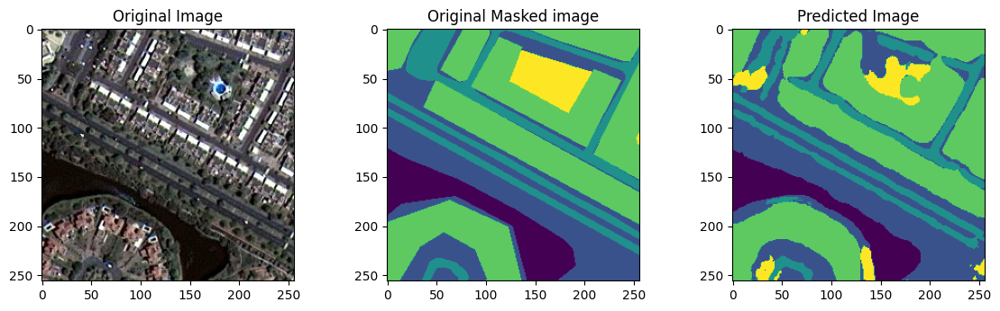

In [134]:
plt.figure(figsize=(14,8))
plt.subplot(231)
plt.title("Original Image")
plt.imshow(test_image)
plt.subplot(232)
plt.title("Original Masked image")
plt.imshow(ground_truth_image)
plt.subplot(233)
plt.title("Predicted Image")
plt.imshow(predicted_image)


In [135]:
model.save("satellite_segmentation_full.h5")

/Users/dhirajmarathe/miniconda3/envs/myenv/lib/python3.8/site-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


In [136]:
!ls -lah

total 1648032
drwxr-x---+ 457 dhirajmarathe  staff    14K May  3 19:18 .
drwxr-xr-x    5 root           admin   160B Mar 27 18:07 ..
-r--------    1 dhirajmarathe  staff     7B Oct  2  2022 .CFUserTextEncoding
-rw-r--r--@   1 dhirajmarathe  staff    24K May  3 19:18 .DS_Store
drwx------+  20 dhirajmarathe  staff   640B May  3 19:18 .Trash
drwxr-xr-x    4 dhirajmarathe  staff   128B Oct 20  2023 .anaconda
drwxr-xr-x@  12 dhirajmarathe  staff   384B Nov  7 19:50 .anydesk
drwxr-xr-x    4 dhirajmarathe  staff   128B Oct 13  2023 .aws
-rw-r--r--    1 dhirajmarathe  staff   527B Oct  4  2022 .bash_profile
drwxr-xr-x    5 dhirajmarathe  staff   160B Feb 29 23:53 .cache
drwxr-xr-x    7 dhirajmarathe  staff   224B Feb 28 00:20 .codeium
drwxr-xr-x    4 dhirajmarathe  staff   128B Oct 20  2023 .conda
-rw-r--r--    1 dhirajmarathe  staff    23B Oct  4  2022 .condarc
drwxr-xr-x    4 dhirajmarathe  staff   128B Aug  9  2023 .config
drwxr-xr-x    3 dhirajmarathe  staff    96B Oct  4  2022 .continuum


In [137]:
from tensorflow.keras.models import load_model
from tensorflow.keras.metrics import MeanIoU

# Define the custom metric function
def jaccard_coef(y_true, y_pred):
    intersection = tf.reduce_sum(y_true * y_pred, axis=(1, 2, 3))
    union = tf.reduce_sum(y_true + y_pred, axis=(1, 2, 3)) - intersection
    return tf.reduce_mean((intersection + 1e-15) / (union + 1e-15), axis=0)

# Load the model with custom metric function
model = load_model("satellite_segmentation_full.h5", custom_objects={'jaccard_coef': jaccard_coef})


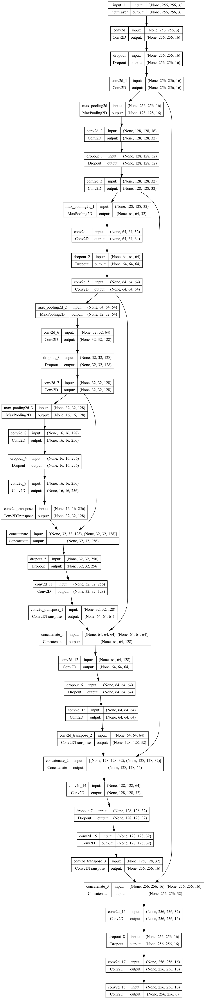

In [138]:
plot_model(model, to_file='satellite_model_plot.png', show_shapes=True, show_layer_names=True)


In [139]:
pip install wandb

Note: you may need to restart the kernel to use updated packages.


In [142]:
import wandb
wandb.login(key="your_api_key")


wandb: W&B API key is configured. Use `wandb login --relogin` to force relogin
wandb: WARNING If you're specifying your api key in code, ensure this code is not shared publicly.
wandb: WARNING Consider setting the WANDB_API_KEY environment variable, or running `wandb login` from the command line.
wandb: Appending key for api.wandb.ai to your netrc file: /Users/dhirajmarathe/.netrc


True

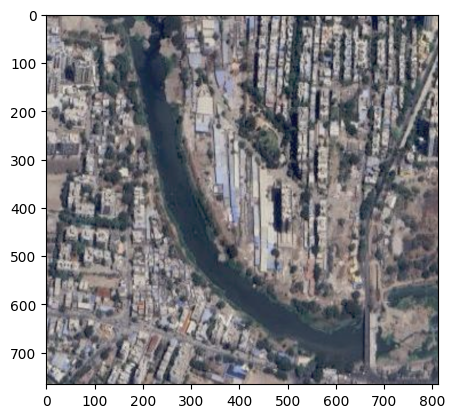

In [178]:
plt.imshow(Image.open('/Users/dhirajmarathe/Desktop/sat1.png'))

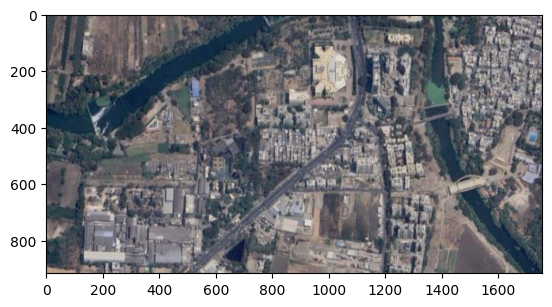

In [183]:
plt.imshow(Image.open('/Users/dhirajmarathe/Desktop/sat2.png'))

In [188]:
image = Image.open('/Users/dhirajmarathe/Desktop/sat1.png')
image = image.convert('RGB')
image = image.resize((256,256))
image = np.array(image)
image = np.expand_dims(image, 0)

In [189]:

prediction = model.predict(image)

1/1 [==============================] - 0s 70ms/step


In [190]:

predicted_image = np.argmax(prediction, axis=3)
predicted_image = predicted_image[0,:,:]

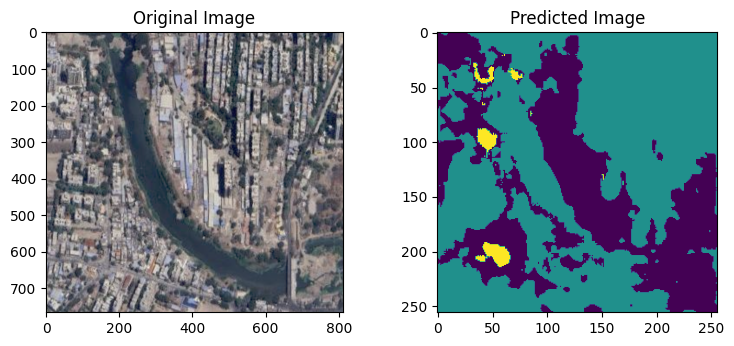

In [191]:
plt.figure(figsize=(14,8))
plt.subplot(231)
plt.title("Original Image")
plt.imshow(Image.open('/Users/dhirajmarathe/Desktop/sat1.png'))
plt.subplot(232)
plt.title("Predicted Image")
plt.imshow(predicted_image)

In [192]:
!pip install keract

In [193]:
import keract as ke

In [194]:
activations = ke.get_activations(model,image,nodes_to_evaluate=None,output_format='simple', auto_compile=True)

In [195]:
activations

OrderedDict([('input_1',
              array([[[[ 98,  90,  90],
                       [101,  93,  94],
                       [ 87,  79,  80],
                       ...,
                       [182, 177, 172],
                       [183, 177, 169],
                       [166, 159, 150]],
              
                      [[126, 118, 118],
                       [115, 107, 107],
                       [ 98,  89,  90],
                       ...,
                       [179, 174, 170],
                       [180, 173, 166],
                       [171, 164, 155]],
              
                      [[154, 144, 146],
                       [143, 134, 135],
                       [131, 121, 121],
                       ...,
                       [175, 170, 165],
                       [176, 170, 162],
                       [185, 178, 169]],
              
                      ...,
              
                      [[ 94,  97,  95],
                       [ 89,  94,  94],
 

In [196]:
ke.display_activations(activations, cmap='viridis', save = True, directory="/Users/dhirajmarathe/Desktop/Semantic Segmentation")

input_1 (1, 256, 256, 3) 
conv2d (1, 256, 256, 16) 
dropout (1, 256, 256, 16) 
conv2d_1 (1, 256, 256, 16) 
max_pooling2d (1, 128, 128, 16) 
conv2d_2 (1, 128, 128, 32) 
dropout_1 (1, 128, 128, 32) 
conv2d_3 (1, 128, 128, 32) 
max_pooling2d_1 (1, 64, 64, 32) 
conv2d_4 (1, 64, 64, 64) 
dropout_2 (1, 64, 64, 64) 
conv2d_5 (1, 64, 64, 64) 
max_pooling2d_2 (1, 32, 32, 64) 
conv2d_6 (1, 32, 32, 128) 
dropout_3 (1, 32, 32, 128) 
conv2d_7 (1, 32, 32, 128) 
max_pooling2d_3 (1, 16, 16, 128) 
conv2d_8 (1, 16, 16, 256) 
dropout_4 (1, 16, 16, 256) 
conv2d_9 (1, 16, 16, 256) 
conv2d_transpose (1, 32, 32, 128) 
concatenate (1, 32, 32, 256) 
dropout_5 (1, 32, 32, 256) 
conv2d_11 (1, 32, 32, 128) 
conv2d_transpose_1 (1, 64, 64, 64) 
concatenate_1 (1, 64, 64, 128) 
conv2d_12 (1, 64, 64, 64) 
dropout_6 (1, 64, 64, 64) 
conv2d_13 (1, 64, 64, 64) 
conv2d_transpose_2 (1, 128, 128, 32) 
concatenate_2 (1, 128, 128, 64) 
conv2d_14 (1, 128, 128, 32) 
dropout_7 (1, 128, 128, 32) 
conv2d_15 (1, 128, 128, 32) 
conv

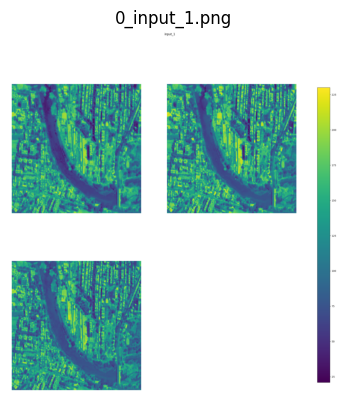

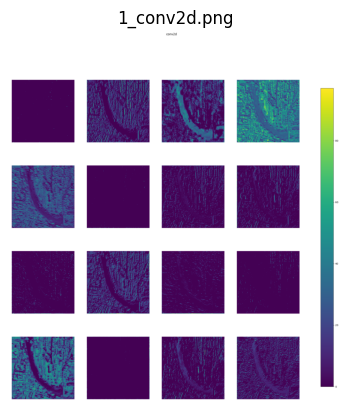

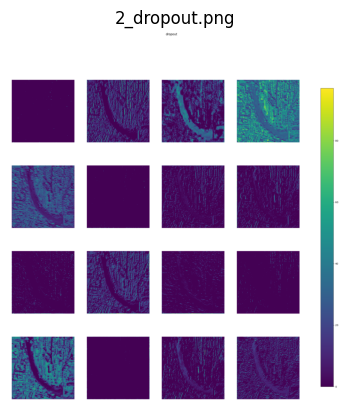

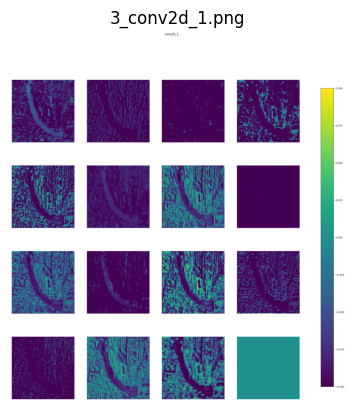

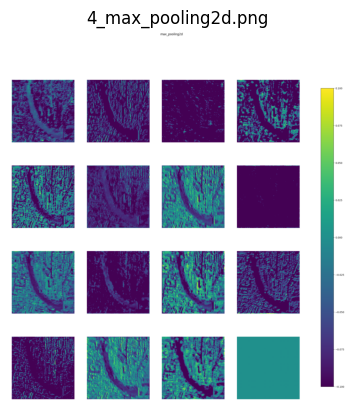

...

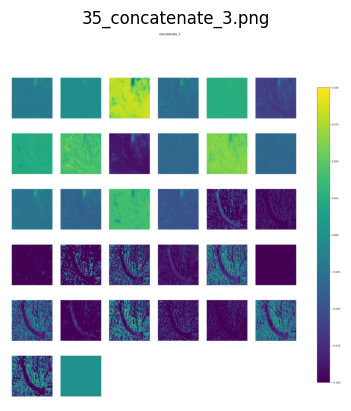

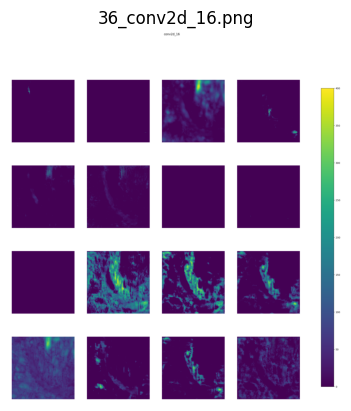

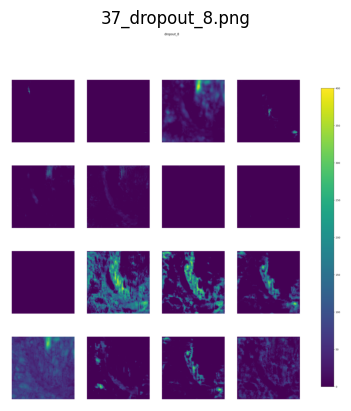

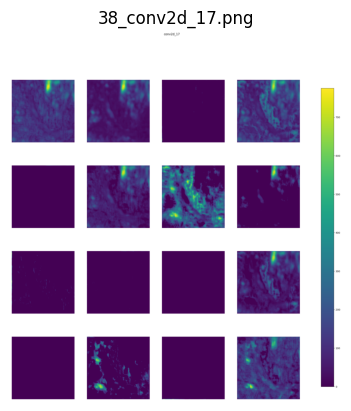

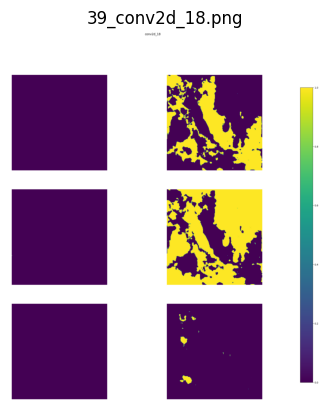

In [204]:
import matplotlib.pyplot as plt
import os
import re

# Directory containing the images
directory = '/Users/dhirajmarathe/Desktop/Semantic Segmentation /activation image'

# Get the list of files in the directory and sort them based on the numeric part of their names
image_files = os.listdir(directory)
image_files.sort(key=lambda x: int(re.findall(r'\d+', x)[0]))


for image_file in image_files:
    
    image_path = os.path.join(directory, image_file)
    
    # Load and plot the image
    image = plt.imread(image_path)
    plt.imshow(image)
    plt.title(image_file)  
    plt.axis('off')  
    plt.show()


In [205]:
image = Image.open('/Users/dhirajmarathe/Desktop/sat1.png')
image = image.resize((256,256))
image_as_array = np.array(image)
image_as_array = image_as_array.astype(np.float32)
ke.display_heatmaps(activations, image_as_array, save=True, directory='/Users/dhirajmarathe/Desktop/Semantic Segmentation /heatmap images')

input_1 (1, 256, 256, 3) 
conv2d (1, 256, 256, 16) 
dropout (1, 256, 256, 16) 
conv2d_1 (1, 256, 256, 16) 
max_pooling2d (1, 128, 128, 16) 
conv2d_2 (1, 128, 128, 32) 
dropout_1 (1, 128, 128, 32) 
conv2d_3 (1, 128, 128, 32) 
max_pooling2d_1 (1, 64, 64, 32) 
conv2d_4 (1, 64, 64, 64) 
dropout_2 (1, 64, 64, 64) 
conv2d_5 (1, 64, 64, 64) 
max_pooling2d_2 (1, 32, 32, 64) 
conv2d_6 (1, 32, 32, 128) 
dropout_3 (1, 32, 32, 128) 
conv2d_7 (1, 32, 32, 128) 
max_pooling2d_3 (1, 16, 16, 128) 
conv2d_8 (1, 16, 16, 256) 
dropout_4 (1, 16, 16, 256) 
conv2d_9 (1, 16, 16, 256) 
conv2d_transpose (1, 32, 32, 128) 
concatenate (1, 32, 32, 256) 
dropout_5 (1, 32, 32, 256) 
conv2d_11 (1, 32, 32, 128) 
conv2d_transpose_1 (1, 64, 64, 64) 
concatenate_1 (1, 64, 64, 128) 
conv2d_12 (1, 64, 64, 64) 
dropout_6 (1, 64, 64, 64) 
conv2d_13 (1, 64, 64, 64) 
conv2d_transpose_2 (1, 128, 128, 32) 
concatenate_2 (1, 128, 128, 64) 
conv2d_14 (1, 128, 128, 32) 
dropout_7 (1, 128, 128, 32) 
conv2d_15 (1, 128, 128, 32) 
conv

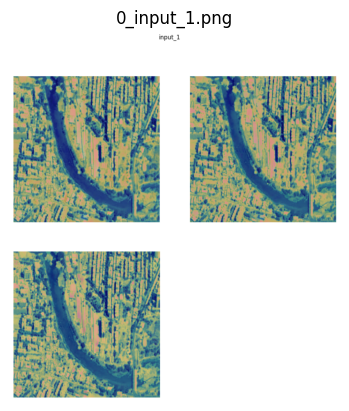

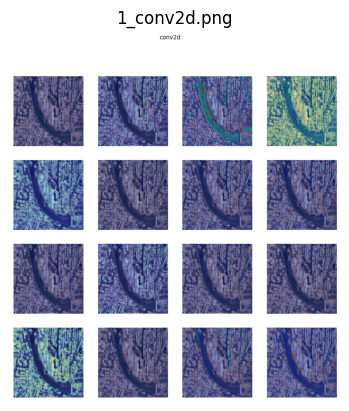

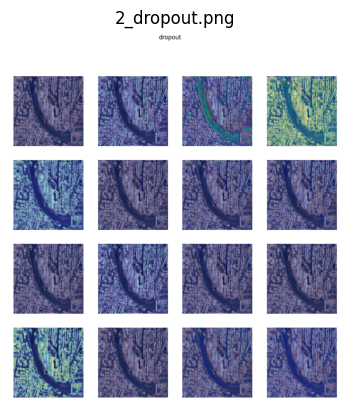

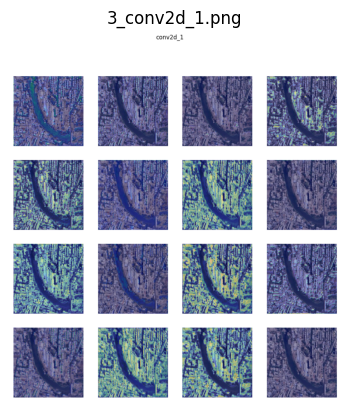

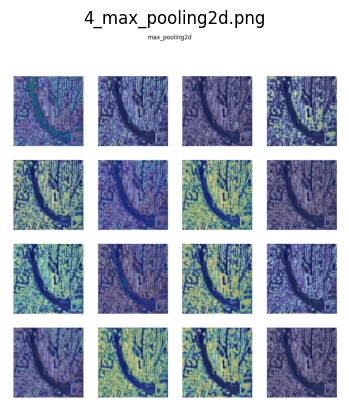

...

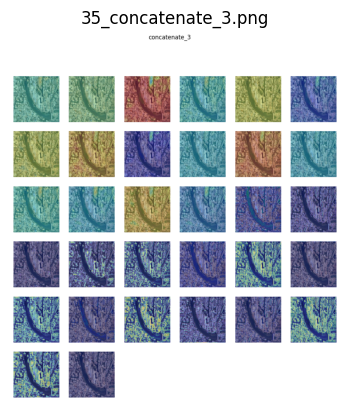

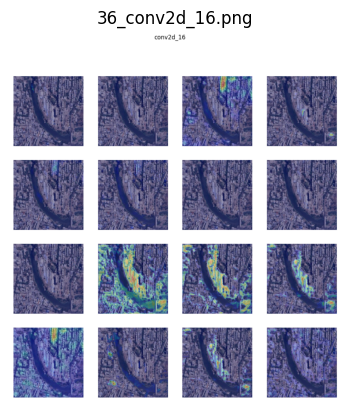

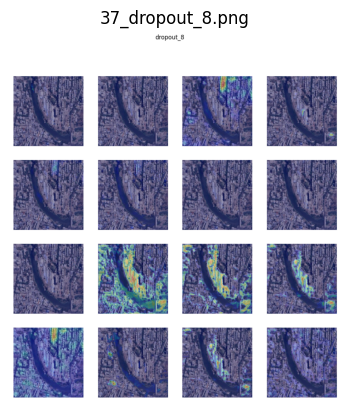

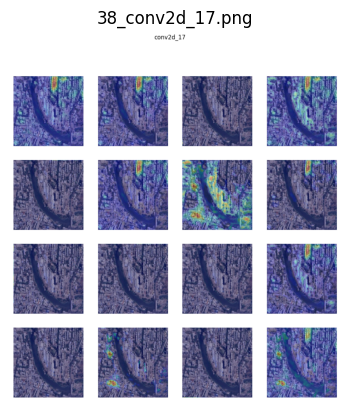

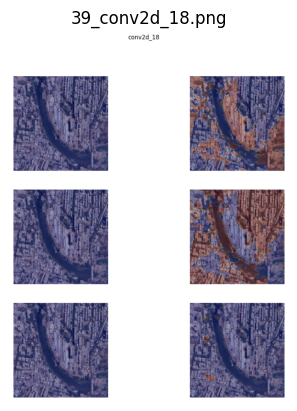

In [206]:
import matplotlib.pyplot as plt
import os
import re

# Directory containing the images
directory = '/Users/dhirajmarathe/Desktop/Semantic Segmentation /heatmap images'

# Get the list of files in the directory and sort them based on the numeric part of their names
image_files = os.listdir(directory)
image_files.sort(key=lambda x: int(re.findall(r'\d+', x)[0]))


for image_file in image_files:
    
    image_path = os.path.join(directory, image_file)
    
    # Load and plot the image
    image = plt.imread(image_path)
    plt.imshow(image)
    plt.title(image_file)  
    plt.axis('off')  
    plt.show()


In [209]:
pip install gradio

  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 107.3/107.3 kB 3.3 MB/s eta 0:00:00
  Using cached urllib3-2.2.1-py3-none-any.whl.metadata (6.4 kB)
  Using cached python_dotenv-1.0.1-py3-none-any.whl.metadata (23 kB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.3/12.3 MB 5.5 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 314.6/314.6 kB 7.3 MB/s eta 0:00:00:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 409.3/409.3 kB 12.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.8/1.8 MB 5.7 MB/s eta 0:00:00a 0:00:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 8.0/8.0 MB 5.6 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 47.2/47.2 kB 202.7 kB/s eta 0:00:00 0:00:01
Using cached urllib3-2.2.1-py3-none-any.whl (121 kB)
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 92.0/92.0 kB 9.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.8/60.8 kB 5.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━

In [210]:
import gradio as gr

/Users/dhirajmarathe/miniconda3/envs/myenv/lib/python3.8/site-packages/huggingface_hub/utils/_runtime.py:184: UserWarning: Pydantic is installed but cannot be imported. Please check your installation. `huggingface_hub` will default to not using Pydantic. Error message: '{e}'
  warnings.warn(


ImportError: cannot import name 'TypeAliasType' from 'typing_extensions' (/Users/dhirajmarathe/miniconda3/envs/myenv/lib/python3.8/site-packages/typing_extensions.py)

In [211]:
pip show gradio

Name: gradio
Version: 4.29.0
Summary: Python library for easily interacting with trained machine learning models
Home-page: 
Author: 
Author-email: Abubakar Abid <gradio-team@huggingface.co>, Ali Abid <gradio-team@huggingface.co>, Ali Abdalla <gradio-team@huggingface.co>, Dawood Khan <gradio-team@huggingface.co>, Ahsen Khaliq <gradio-team@huggingface.co>, Pete Allen <gradio-team@huggingface.co>, Ömer Faruk Özdemir <gradio-team@huggingface.co>, Freddy A Boulton <gradio-team@huggingface.co>, Hannah Blair <gradio-team@huggingface.co>
License: 
Location: /Users/dhirajmarathe/miniconda3/envs/myenv/lib/python3.8/site-packages
Requires: aiofiles, altair, fastapi, ffmpy, gradio-client, httpx, huggingface-hub, importlib-resources, jinja2, markupsafe, matplotlib, numpy, orjson, packaging, pandas, pillow, pydantic, pydub, python-multipart, pyyaml, ruff, semantic-version, tomlkit, typer, typing-extensions, urllib3, uvicorn
Required-by: 
Note: you may need to restart the kernel to use updated packa

In [212]:
pip install --upgrade typing-extensions gradio


Note: you may need to restart the kernel to use updated packages.
